## Helper Functions

In [1]:
import pickle
import cv2
import numpy as np
from os import listdir
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


## 1. Camera Image Distortion Correction

In [2]:
path = "camera_cal"
imagesList = listdir(path)

nx = 9
ny = 6

image_points = []
obj_points = []

# Prepare object points
objp = np.zeros((ny*nx,3),np.float32)
objp[:,:2] = np.mgrid[0:nx , 0:ny].T.reshape(-1,2)

count = 0
for image in (imagesList):
    # Load Image
    img = mpimg.imread(path + "/" + image)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        image_points.append(corners)
        obj_points.append(objp)
        
print("Done")

Done


### UnDistort Test

In [3]:
def cal_cam(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    
    return mtx,dist

def undistort(img, objpoints, imgpoints):
    mtx,dist = cal_cam(img, objpoints, imgpoints)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

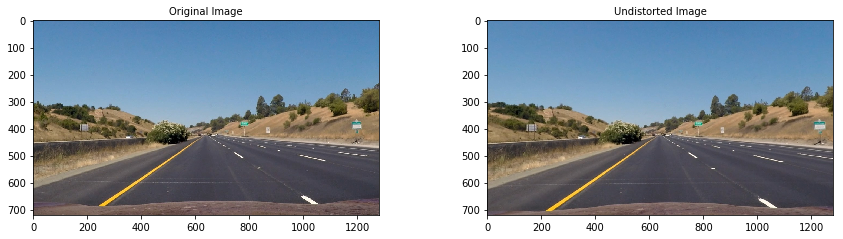

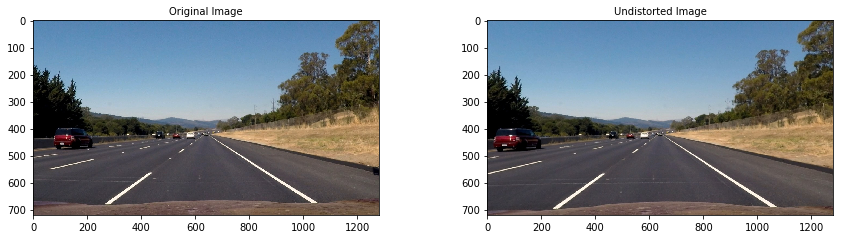

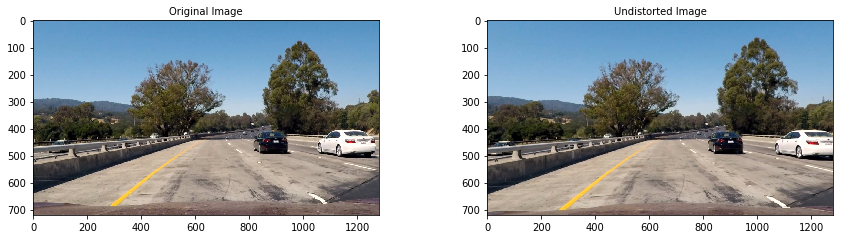

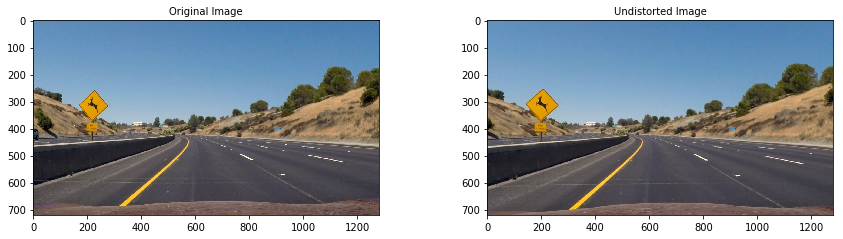

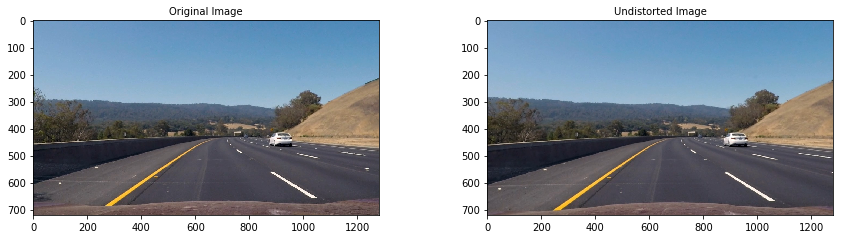

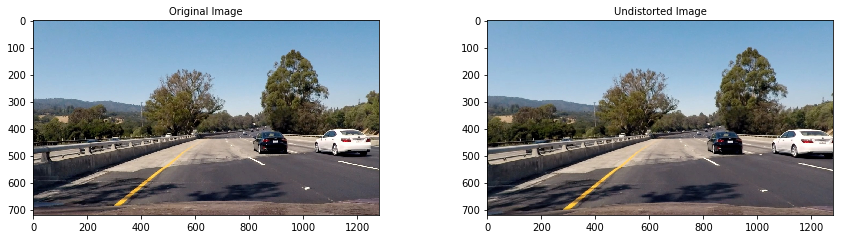

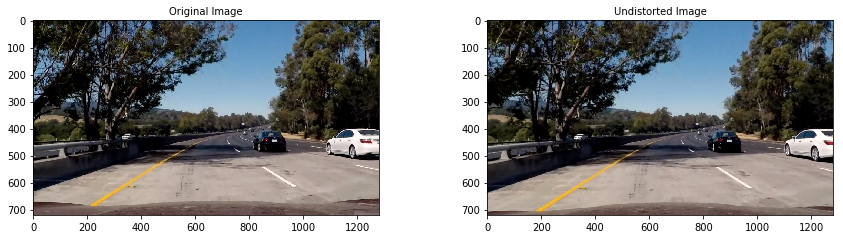

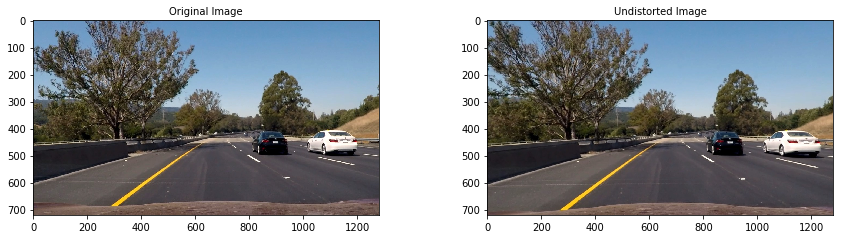

In [4]:
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = mpimg.imread(path + "/" + image)
    undistorted = undistort(img, obj_points, image_points)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

## 2. Prespective Transform

In [5]:
def warp_img(img, src, dst):
    h,w = img.shape[:2]
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a bird's eye view
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv

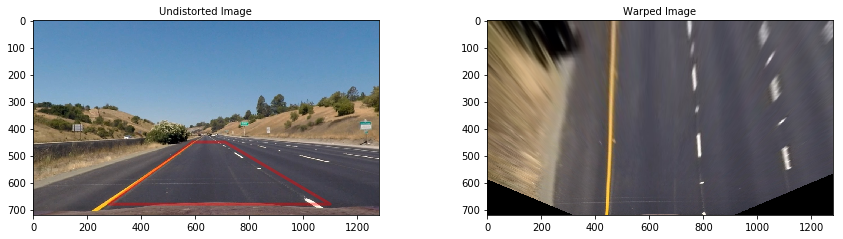

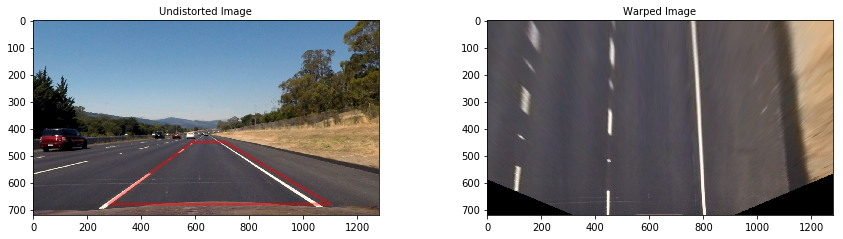

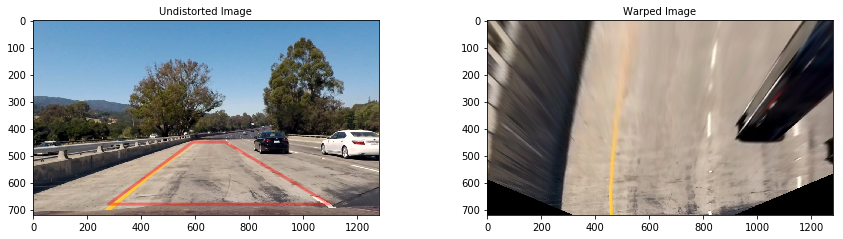

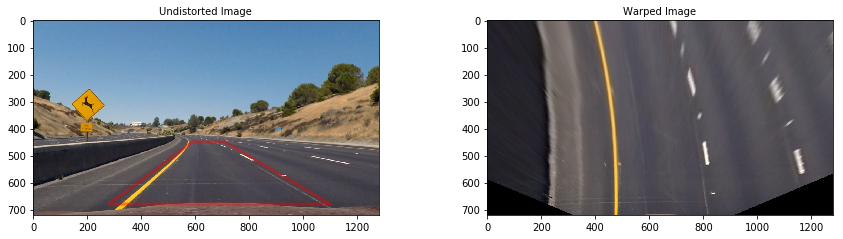

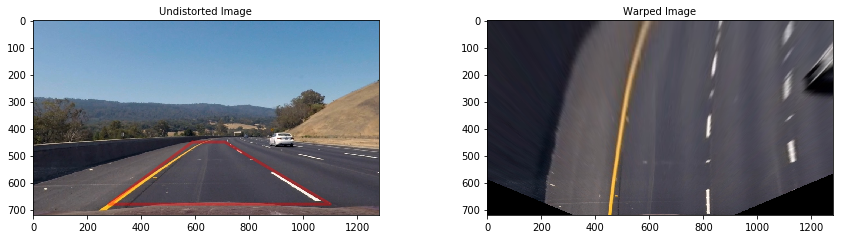

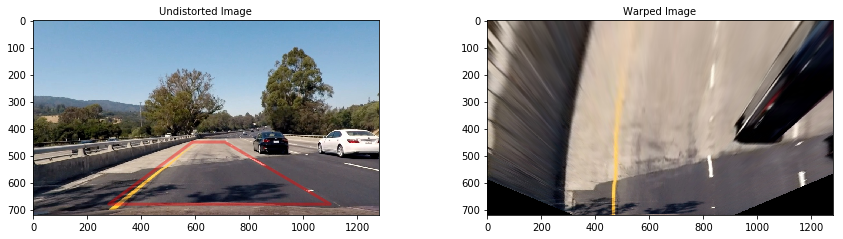

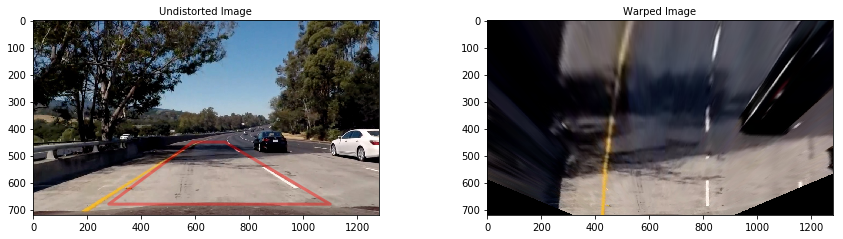

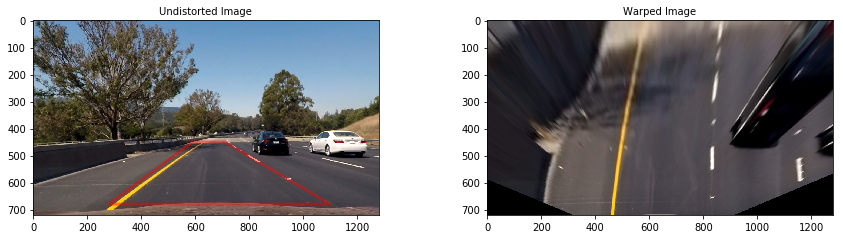

In [76]:
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = mpimg.imread(path + "/" + image)
    
    w = img.shape[1]
    h = img.shape[0]
    src = np.float32([(590,450),
                  (710,450), 
                  (280,680), 
                  (1100,680)])

    dst = np.float32([(450,0),
                      (w-450,0),
                      (450,h),
                      (w-450,h)])
    
    # First Undistort the image
    undistorted = undistort(img, obj_points, image_points)
    # Warp the image
    warped, M, Minv = warp_img(undistorted, src, dst)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
    f.tight_layout()
    ax1.imshow(undistorted)
    x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
    y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
    ax1.plot(x, y, color='r', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    ax1.set_title('Undistorted Image', fontsize=10)
    ax2.imshow(warped)
    ax2.set_title('Warped Image', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()


## 3. Gradient and Color Thresholding

In [43]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
   # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def hls_threshold(image,select = 's', thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    if(select == 'h'):     
        binary_output = np.zeros_like(H)
        binary_output[(H > thresh[0]) & (H <= thresh[1])] = 1
    
    if(select == 'l'):     
        binary_output = np.zeros_like(L)
        binary_output[(L > thresh[0]) & (L <= thresh[1])] = 1
        
    if(select == 's'):     
        binary_output = np.zeros_like(S)
        binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

def rgb_rthresh(img, thresh=(230, 255)):
    rgb_r = img[:,:,0]
    rgb_r = rgb_r*(255/np.max(rgb_r))
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(rgb_r)
    binary_output[(rgb_r > thresh[0]) & (rgb_r <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

def combined_filter(img):
    
    # Choose a Sobel kernel size
    ksize = 3 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(30, 100))#60,100
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(30, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(10, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0, 0.5))
    s_binary = hls_threshold(img, thresh=(80, 255))
    l_binary = hls_threshold(img,select = 'l', thresh=(100, 255))
    rgb_r = rgb_rthresh(img)
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(gradx)
    combined_binary[((((gradx == 1) & (l_binary  == 1)) | ((mag_binary == 1) & (dir_binary == 1))) & (s_binary == 1)) | (rgb_r == 1)] = 1
    
    return combined_binary

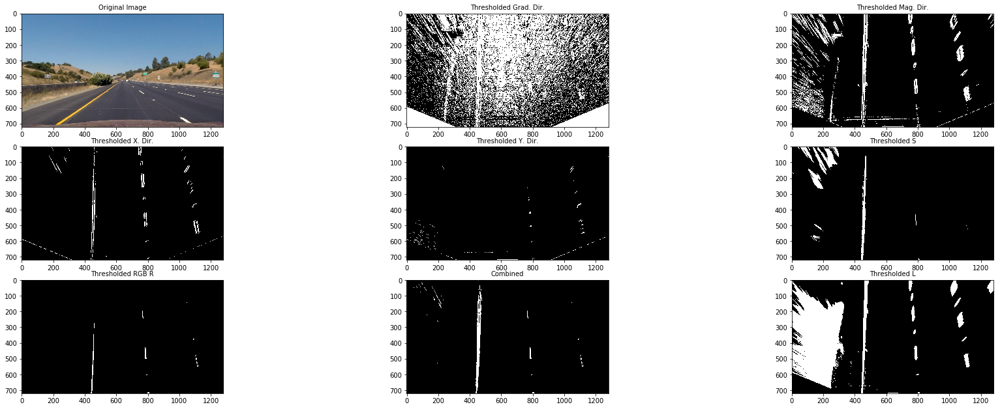

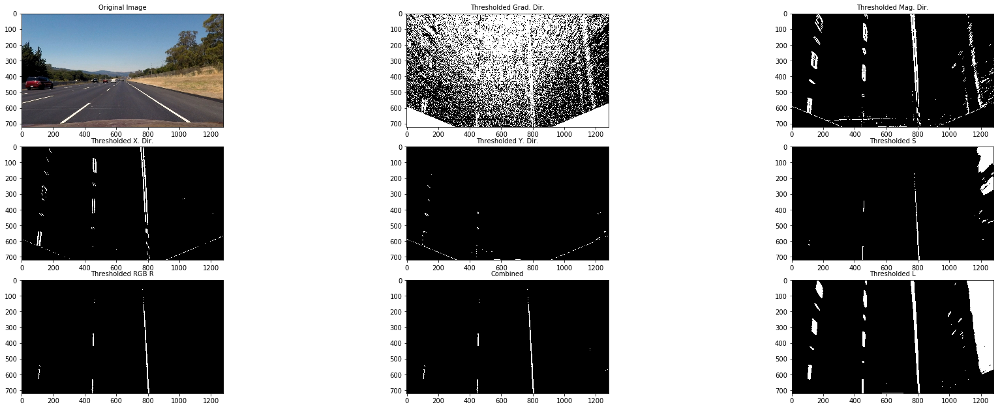

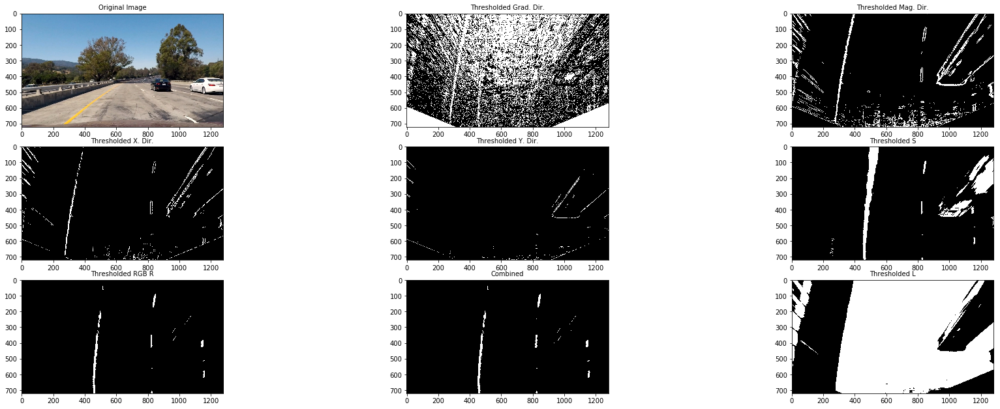

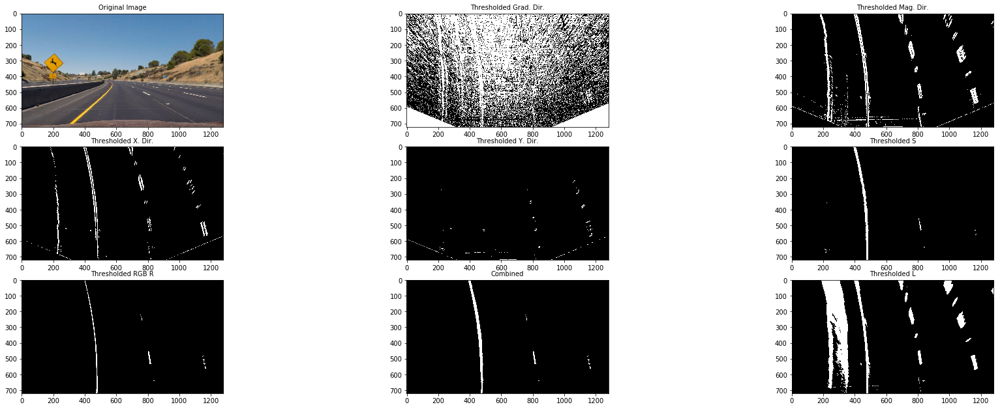

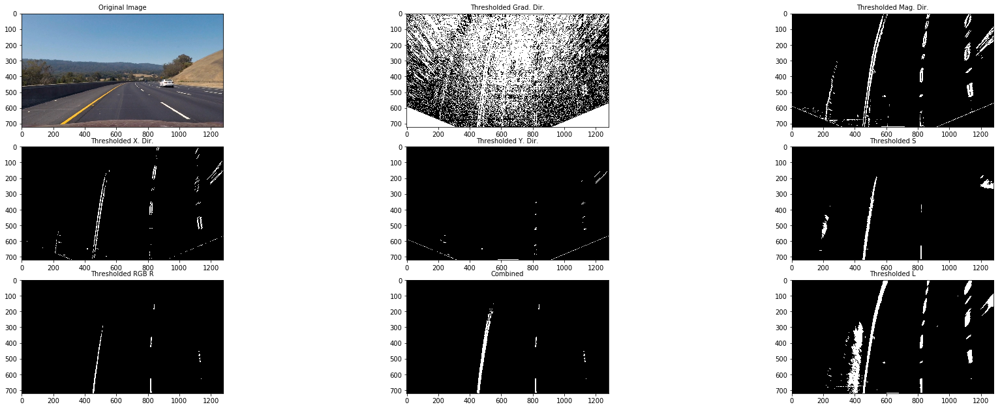

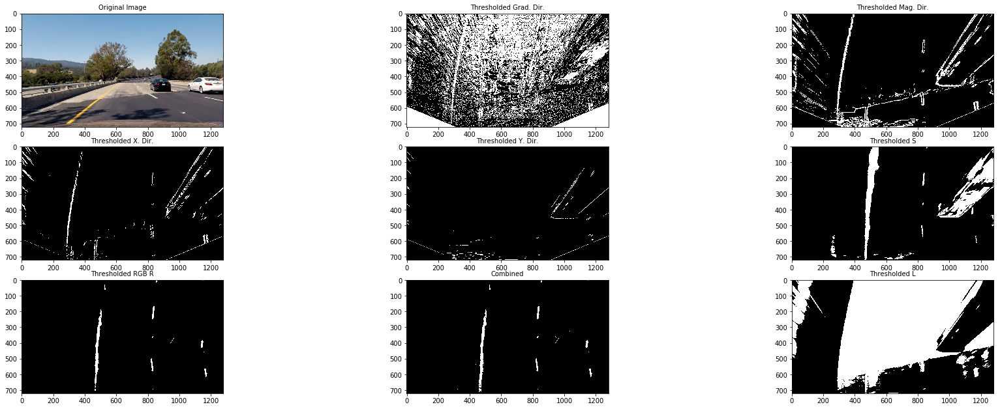

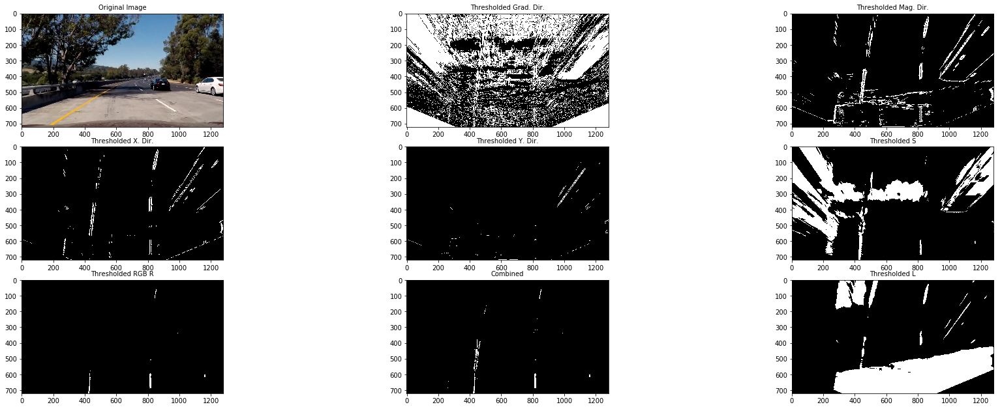

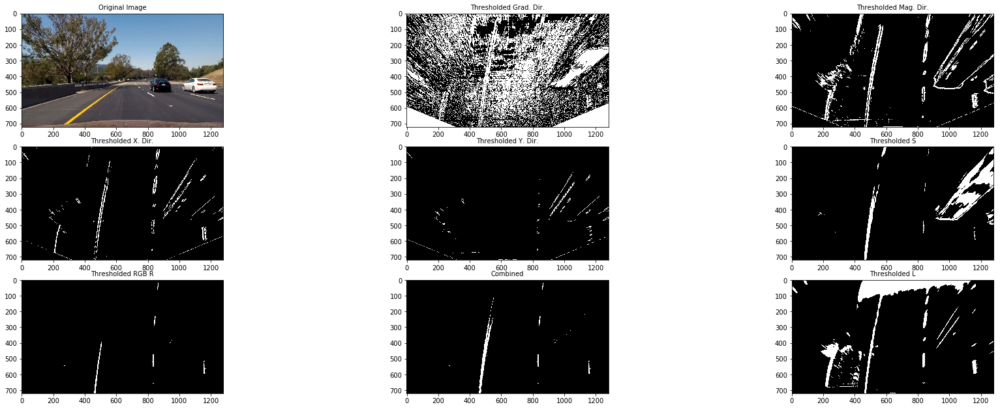

In [44]:
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = mpimg.imread(path + "/" + image)
    
    w = img.shape[1]
    h = img.shape[0]
    '''
    src = np.float32([(575,464),
                  (707,464), 
                  (258,682), 
                  (1049,682)])
    dst = np.float32([(450,0),
                      (w-450,0),
                      (450,h),
                      (w-450,h)])
    '''
    
    src = np.float32([(590,450),
                  (710,450), 
                  (280,680), 
                  (1100,680)])

    dst = np.float32([(450,0),
                      (w-450,0),
                      (450,h),
                      (w-450,h)])

    # First Undistort the image
    undistorted = undistort(img, obj_points, image_points)
    # Warp the image
    warped, M, Minv = warp_img(undistorted, src, dst)

    
    # Choose a Sobel kernel size
    ksize = 3 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=ksize, thresh=(30, 100))#60,100
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=ksize, thresh=(30, 100))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(10, 100))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0, 0.5))
    s_binary = hls_threshold(warped, thresh=(100, 255))
    h_binary = hls_threshold(warped,select = 'h', thresh=(15, 100))
    l_binary = hls_threshold(warped,select = 'l', thresh=(100, 255))
    rgb_r = rgb_rthresh(warped)
    
    # Combine the two binary thresholds
    combined_binary = combined_filter(warped)
    
    f, axes = plt.subplots(3, 3, figsize=(24, 9))
    f.tight_layout()
    axes[0,0].imshow(undistorted)
    axes[0,0].set_title('Original Image', fontsize=10)
    
    axes[0,1].imshow(dir_binary, cmap='gray')
    axes[0,1].set_title('Thresholded Grad. Dir.', fontsize=10)

    axes[0,2].imshow(mag_binary, cmap='gray')
    axes[0,2].set_title('Thresholded Mag. Dir.', fontsize=10)

    axes[1,0].imshow(gradx, cmap='gray')
    axes[1,0].set_title('Thresholded X. Dir.', fontsize=10)

    axes[1,1].imshow(grady, cmap='gray')
    axes[1,1].set_title('Thresholded Y. Dir.', fontsize=10)
    
    axes[1,2].imshow(s_binary, cmap='gray')
    axes[1,2].set_title('Thresholded S', fontsize=10)
    
    axes[2,0].imshow(rgb_r, cmap='gray')
    axes[2,0].set_title('Thresholded RGB R', fontsize=10)
    
    axes[2,1].imshow(combined_binary, cmap='gray')
    axes[2,1].set_title('Combined', fontsize=10)
    
    axes[2,2].imshow(l_binary, cmap='gray')
    axes[2,2].set_title('Thresholded L', fontsize=10)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

### PipeLine

In [45]:
# Define the complete image processing pipeline, reads raw image and returns binary image with lane lines
def pipeline(img):
    w = img.shape[1]
    h = img.shape[0]
    
    src = np.float32([(590,450),
                  (710,450), 
                  (280,680), 
                  (1100,680)])

    dst = np.float32([(450,0),
                      (w-450,0),
                      (450,h),
                      (w-450,h)])
    
    # First Undistort the image
    undistorted = undistort(img, obj_points, image_points)
    # Warp the image
    warped, M, Minv = warp_img(undistorted, src, dst)
    #Threshold the Image
    combined_binary = combined_filter(warped)
    
    return combined_binary, Minv

### Test PipeLine

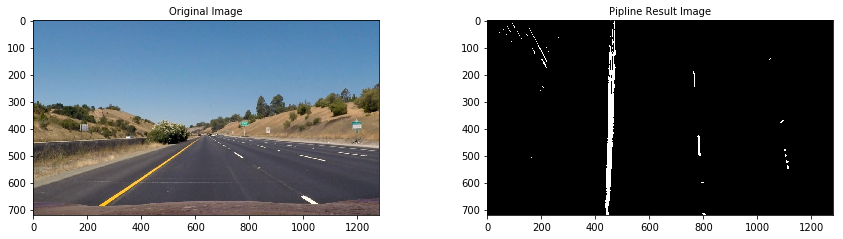

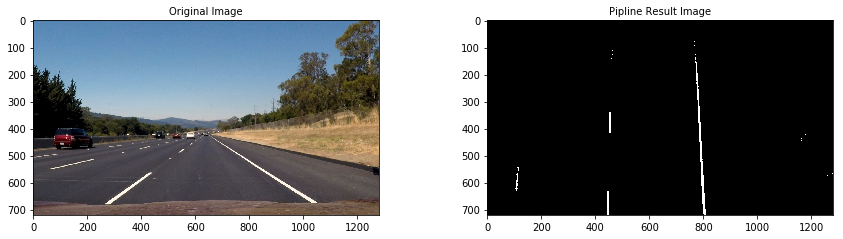

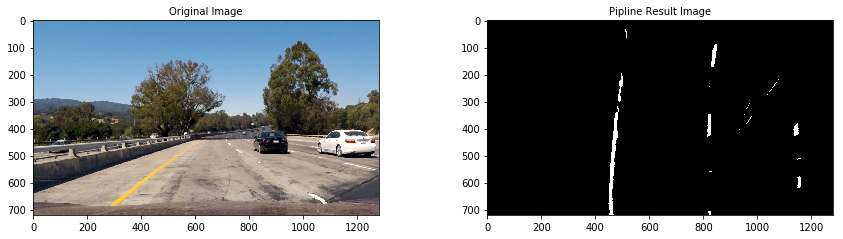

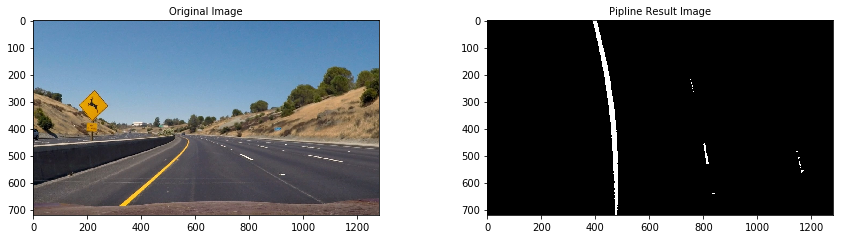

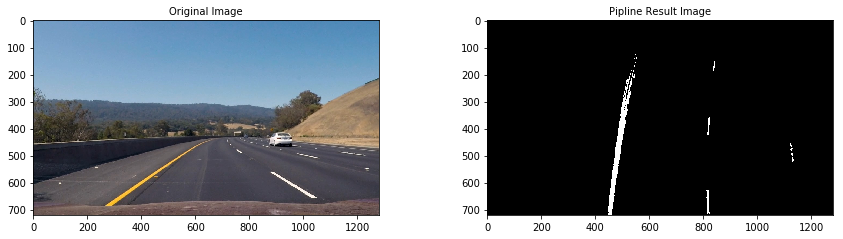

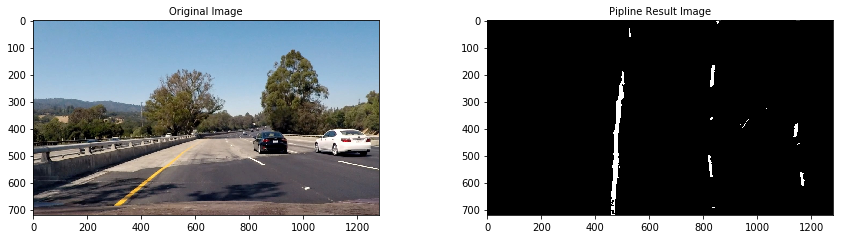

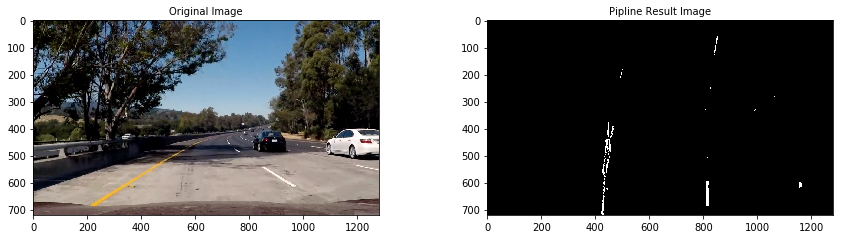

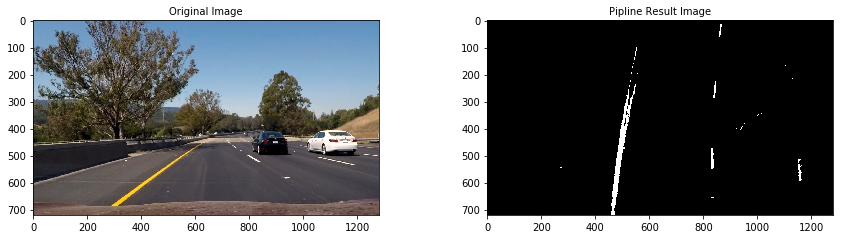

In [46]:
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = mpimg.imread(path + "/" + image)
    
    img_result, Minv = pipeline(img)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(img_result, cmap = 'gray')
    ax2.set_title('Pipline Result Image', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

## 4. Sliding Window

In [47]:
def sliding_window_line_fitting(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    window_data = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        window_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 


    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, window_data, histogram

### Visualization

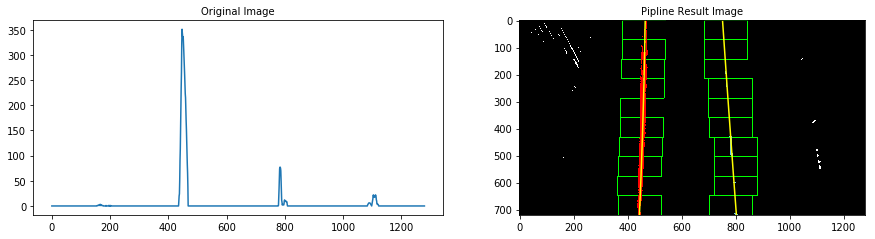

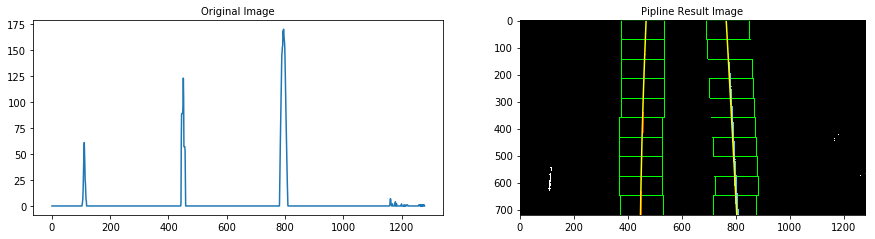

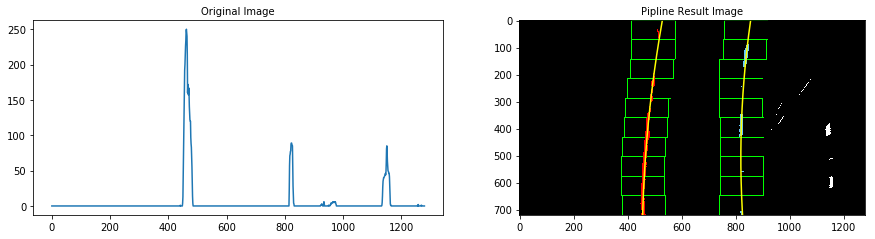

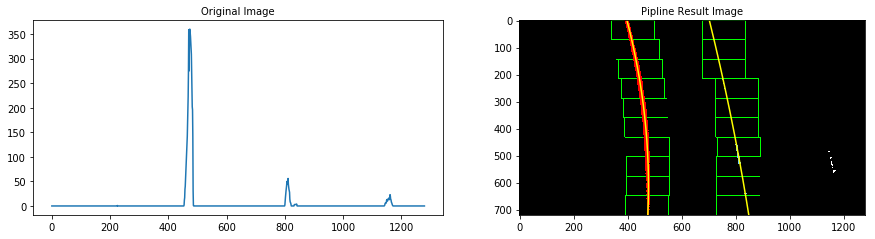

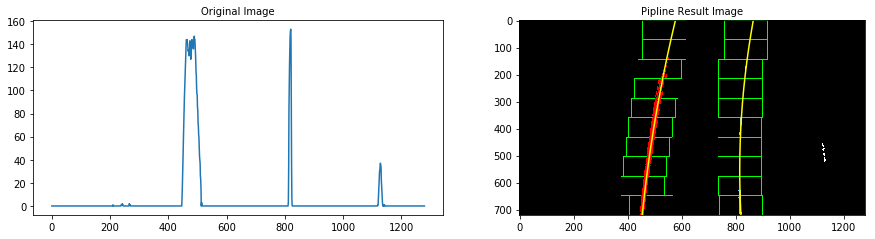

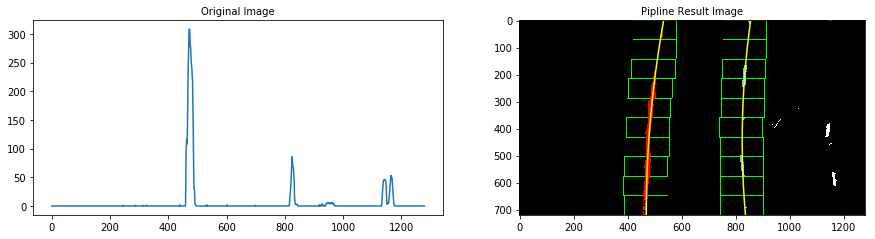

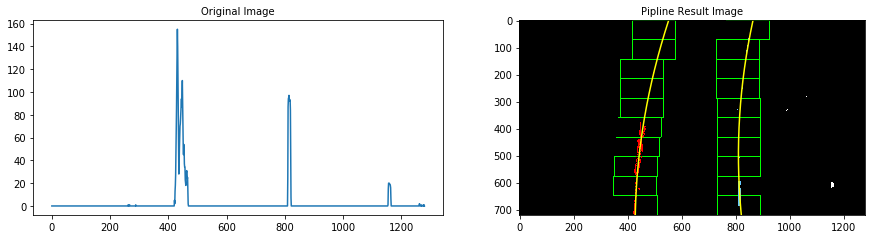

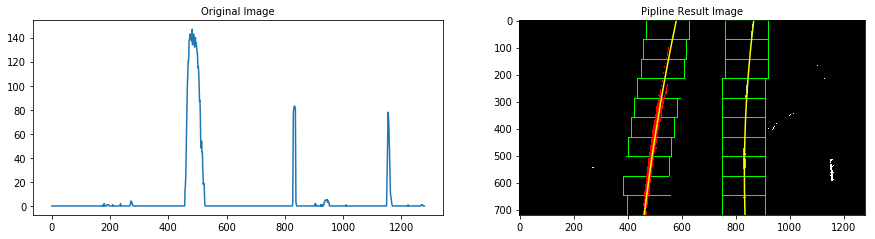

In [48]:
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = mpimg.imread(path + "/" + image)
    
    img_result, Minv = pipeline(img)
    
    left_fit, right_fit, left_lane_inds, right_lane_inds, windows_data, histogram = sliding_window_line_fitting(img_result)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_result.shape[0]-1, img_result.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an output image to draw on and  visualize the result
    out_img = np.uint8(np.dstack((img_result, img_result, img_result))*255)

    for window in windows_data:
    # Draw the windows on the visualization image
        cv2.rectangle(out_img,(window[2],window[0]),(window[3],window[1]),(0,255,0), 2) 
        cv2.rectangle(out_img,(window[4],window[0]),(window[5],window[1]),(0,255,0), 2) 

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img_result.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]    
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
    f.tight_layout()
    ax1.plot(histogram)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(out_img)
    ax2.plot(left_fitx, ploty, color='yellow')
    ax2.plot(right_fitx, ploty, color='yellow')
    ax2.set_title('Pipline Result Image', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

### Line fitting from previous frame

In [49]:
# Define method to fit polynomial to binary image based upon a previous fit
def line_fit_from_prev_frame(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds

## 5. Radius of Curvature

In [50]:
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

### Results

Radius of curvature: 2415.28592317 m, 9063.2949185 m
Distance from lane center: 0.162621783725 m


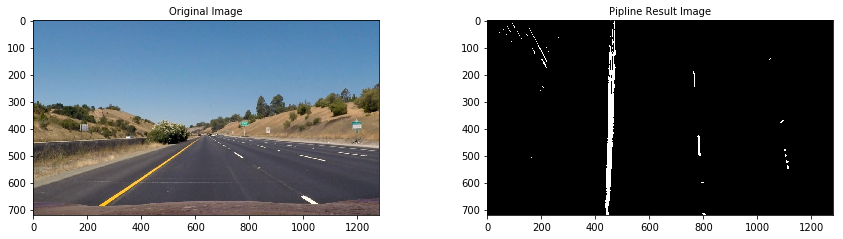

Radius of curvature: 2424.12036917 m, 34369.7584647 m
Distance from lane center: 0.141718416009 m


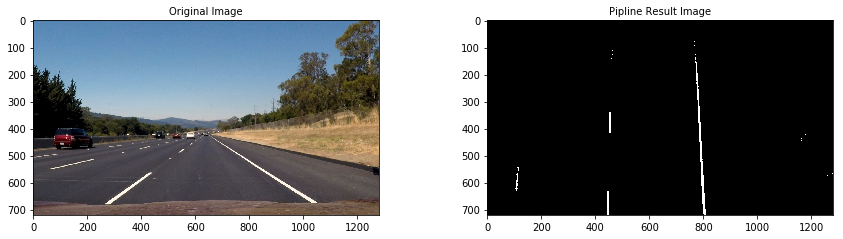

Radius of curvature: 453.824470373 m, 338.070590529 m
Distance from lane center: -0.00760402468578 m


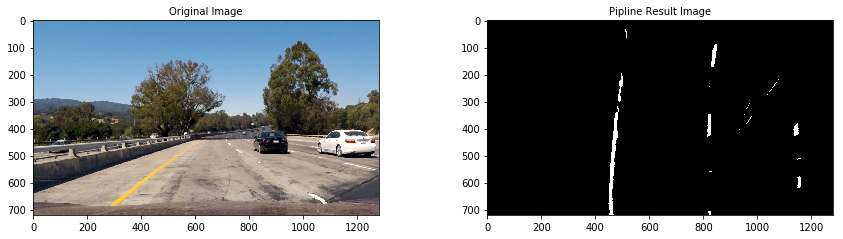

Radius of curvature: 224.432206406 m, 791.36641806 m
Distance from lane center: -0.213195499125 m


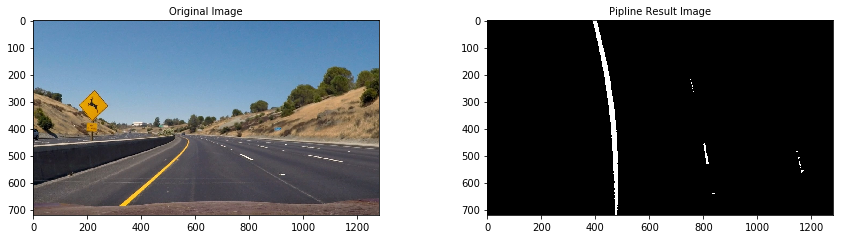

Radius of curvature: 498.885558278 m, 291.852870051 m
Distance from lane center: 0.0305396032314 m


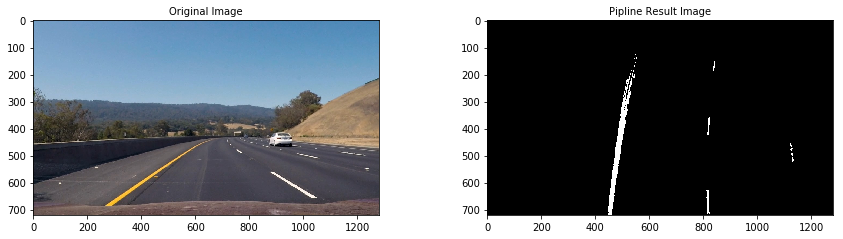

Radius of curvature: 376.981259305 m, 300.918345326 m
Distance from lane center: -0.12485723884 m


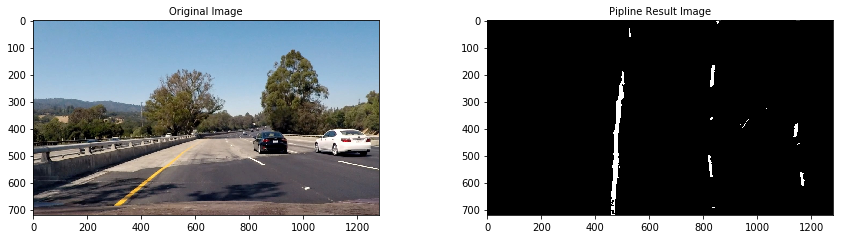

Radius of curvature: 222.561774326 m, 219.24099399 m
Distance from lane center: 0.149158047572 m


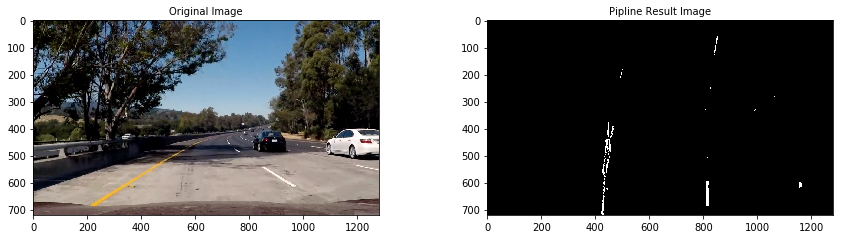

Radius of curvature: 759.266657073 m, 440.560080187 m
Distance from lane center: -0.0817815073498 m


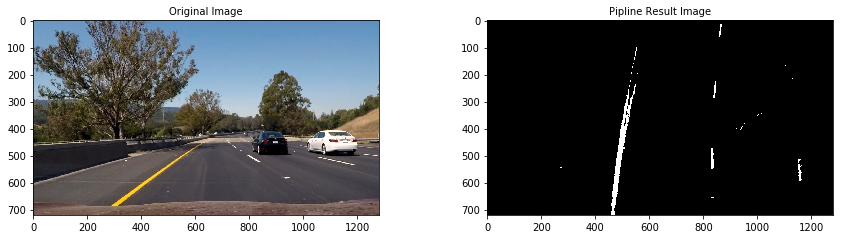

In [55]:
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = mpimg.imread(path + "/" + image)
    
    img_result, Minv = pipeline(img)
    
    left_fit, right_fit, left_lane_inds, right_lane_inds, windows_data, histogram = sliding_window_line_fitting(img_result)


    left_rd, right_rd, center_dist = calc_curv_rad_and_center_dist(img_result, left_fit, right_fit, left_lane_inds, right_lane_inds)

    print('Radius of curvature:', left_rd, 'm,', right_rd, 'm')
    print('Distance from lane center:', center_dist, 'm')
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(img_result, cmap = 'gray')
    ax2.set_title('Pipline Result Image', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

## 6. Draw Lanes and Data

### Draw Lane Lines

In [66]:
def draw_lanes(org_img, binary_img, left_fit, right_fit, Minv):
    new_img = np.copy(org_img)
    if left_fit is None or right_fit is None:
        return original_img

    warped_zeros = np.zeros_like(binary_img).astype(np.uint8)
    color_warped = np.dstack((warped_zeros, warped_zeros, warped_zeros))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))


    cv2.fillPoly(color_warped, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warped, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warped, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    new_warped = cv2.warpPerspective(color_warped, Minv, (w, h)) 

    result = cv2.addWeighted(new_img, 1, new_warped, 0.5, 0)
    
    return result

### Draw Curvature Data

In [69]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

### Visualization

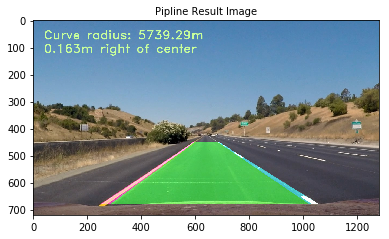

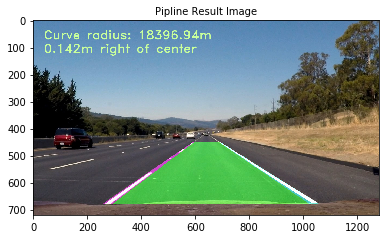

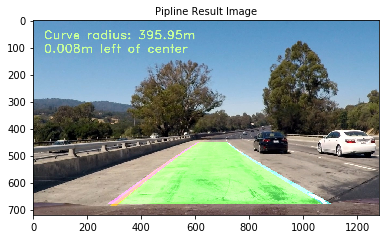

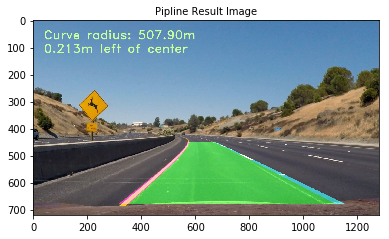

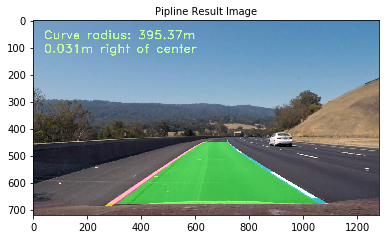

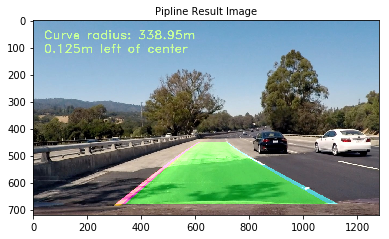

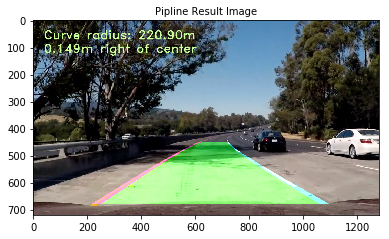

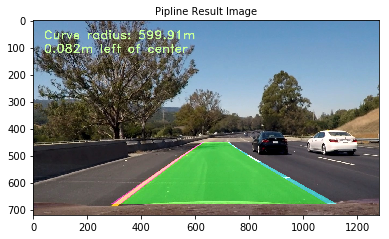

In [70]:
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = mpimg.imread(path + "/" + image)
    
    img_result, Minv = pipeline(img)
    
    left_fit, right_fit, left_lane_inds, right_lane_inds, windows_data, histogram = sliding_window_line_fitting(img_result)

    left_rd, right_rd, center_dist = calc_curv_rad_and_center_dist(img_result, left_fit, right_fit, left_lane_inds, right_lane_inds)
    
    img_result = draw_lanes(img,img_result,left_fit,right_fit, Minv)
    
    img_result = draw_data(img_result,(left_rd+right_rd)/2,center_dist)
    
    f, ax1 = plt.subplots(1, 1, figsize=(12, 3))
    f.tight_layout()
    ax1.imshow(img_result, cmap = 'gray')
    ax1.set_title('Pipline Result Image', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

## 7. Process Image Pipeline

### Line Class

In [71]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

### PipeLine

In [72]:
def process_image(img):
    new_img = np.copy(img)
    img_result, Minv = pipeline(new_img)
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not left_line.detected or not right_line.detected:
        left_fit, right_fit, left_lane_inds, right_lane_inds, windows_data, histogram = sliding_window_line_fitting(img_result)
    else:
        left_fit, right_fit, left_lane_inds, right_lane_inds = line_fit_from_prev_frame(img_result, left_line.best_fit, right_line.best_fit)
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if left_fit is not None and right_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        x_int_diff = abs(right_fit_x_int-left_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            left_fit = None
            right_fit = None
            
    left_line.add_fit(left_fit, left_lane_inds)
    right_line.add_fit(right_fit, right_lane_inds)
    
    # draw the current best fit if it exists
    if left_line.best_fit is not None and right_line.best_fit is not None:
        img_out = draw_lanes(new_img, img_result, left_line.best_fit, right_line.best_fit, Minv)
        left_rd, right_rd, center_dist = calc_curv_rad_and_center_dist(img_result, left_line.best_fit, right_line.best_fit, 
                                                               left_lane_inds, right_lane_inds)
        img_out = draw_data(img_out, (left_rd+right_rd)/2, center_dist)
    else:
        img_out = new_img
    
    return img_out

In [74]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

left_line = Line()
right_line = Line()

white_output = 'test_videos_output/project_video.mp4'
clip1 = VideoFileClip("test_videos/project_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████████████████████████████████▉| 1260/1261 [16:21<00:00,  1.29it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

Wall time: 16min 22s


In [75]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))